In [ ]:
!pip install readlif tifffile numpy==1.24

In [14]:
import numpy as np
import tifffile
from readlif.reader import LifFile
import os
import matplotlib.pyplot as plt
import CellPatchExtraction_package.CellPatchExtraction.src.extraction as ex
from cellplot_package.cellplot.segmentation import rand_col_seg, contoure_seg
import cv2
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from pathlib import Path


lif_path = Path("/home/simon_g/isilon_images_mnt/10_MetaSystems/MetaSystemsData/_simon/src/sören_foci/CM_TAZ_TEAD.lif")  # Replace with your .lif file path
output_folder = Path("/home/simon_g/isilon_images_mnt/10_MetaSystems/MetaSystemsData/_simon/src/sören_foci/images")     # Replace with desired output folder
experiment = lif_path.stem

output_folder = (output_folder / experiment)

if not output_folder.exists():
   output_folder.mkdir()
   
lif_file = LifFile(lif_path)

In [15]:
# Function to apply CLAHE
def apply_CLAHE(image, clip_limit=3.0, tile_grid_size=(64, 64)):
    clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid_size)
    return clahe.apply(image)

In [16]:
images = []
for im in lif_file.get_iter_image():
    tmp = []
    for c in range(im.channels):
        for z in range(im.nz):
            tmp.append(np.array(im.get_frame(z=z, c=c)))

    images.append(np.array(tmp).reshape(3, 5, 512, 512))#.max(axis=0))


In [17]:
images = np.array(images)

In [18]:
print(lif_path.stem)
out_path = Path('/home/simon_g/isilon_images_mnt/10_MetaSystems/MetaSystemsData/_simon/src/sören_foci/raw_images')

if not (out_path / lif_path.stem).exists():
    (out_path / lif_path.stem).mkdir()

for i, im in enumerate(images):
    tifffile.imwrite(out_path / lif_path.stem / f'raw_{i}.tif', im)

CM_TAZ_TEAD


In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(30, 10))

for a, im in zip(ax.ravel(), images[0][:, 3]):
    
    a.imshow(im)
    a.axis('off')


In [ ]:
channel_color_dict = {
    0: [0,0,1],
    #1: [1,0,0],
    2: [0,1,0],
    4: [1,0,1]
}

mc_images = images.max(axis=1)
print(mc_images.shape)

for diameter in [35]:
    
    for im_id, image in enumerate(tqdm(mc_images)):
        
        rgb_image = np.zeros((*image.shape[1:], 3))
        for i, (c, color) in enumerate(channel_color_dict.items()): 
            channel = image[c][..., np.newaxis] * np.array(color)
            channel = np.clip(channel / np.percentile(channel, 99.999), 0, 1)
            rgb_image = np.clip(rgb_image + channel, 0, 1)

        nuclei = apply_CLAHE(image[0], clip_limit=10, tile_grid_size=(16, 16))
        nuclei = nuclei / nuclei.max()

        masks, nuclei = ex.segment_image(
            nuclei, 
            model="CP_TU", 
            cellpose_kwargs=dict(diameter=diameter, normalize=False, flow_threshold=1),
            dilate_masks=False)
        
        right = np.stack([np.clip(nuclei + contoure_seg(masks, ret_rgb=False), 0, 1)]*3).transpose(1,2,0)
        left = np.clip(rgb_image + contoure_seg(masks, ret_rgb=True, rgb_color=[1,1,1]), 0, 1)
        
        combined = np.concatenate((left, right), axis=1)
        plt.imshow(combined)
        plt.tight_layout()
        plt.show()
        
        #plt.imsave(f'{output_folder}/image_{im_id}_D{diameter}.png', combined)
        #tifffile.imwrite(f'{output_folder}/masks_{im_id}_D{diameter}.tif', masks)
    
    # fig, ax = plt.subplots(1, 2, figsize=(20, 10))
    # ax[1].imshow(np.clip(nuclei + contoure_seg(masks, ret_rgb=False), 0, 1), cmap='gray')    
    # ax[1].axis('off')
    
    
    # ax[0].imshow(np.clip(rgb_image + contoure_seg(masks, ret_rgb=True, rgb_color=[1,1,1]), 0, 1), cmap='gray')    
    # ax[0].axis('off')
    
    # plt.tight_layout()
    # plt.show()
    
    # fig, ax = plt.subplots(1, 2, figsize=(20,10))
    
    # ax[0].imshow(rgb_image)
    # ax[1].imshow(image[0], cmap='gray')
    # ax[0].axis('off')
    # ax[1].axis('off')

    # plt.tight_layout()
    # plt.show()


  0%|          | 0/21 [00:00<?, ?it/s]

(512, 512, 3) (512, 512, 3)


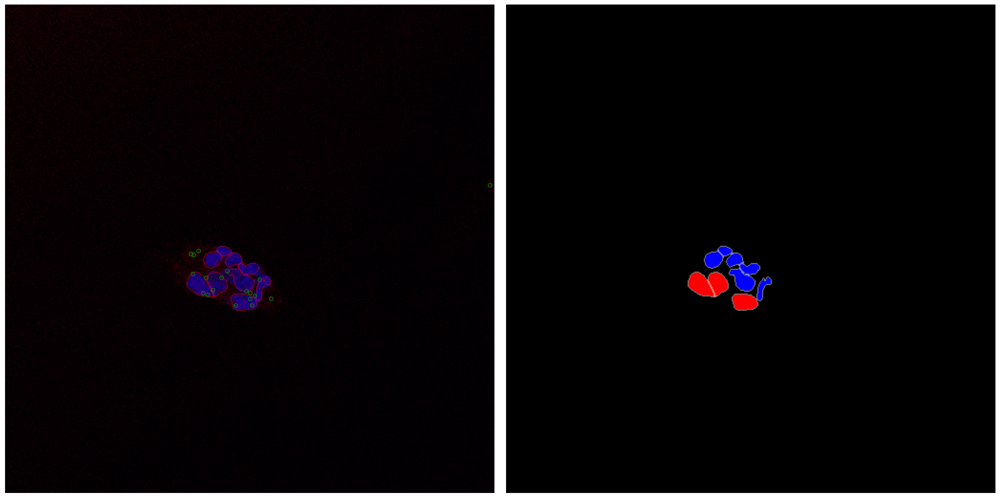

  5%|▍         | 1/21 [00:06<02:17,  6.88s/it]

(512, 512, 3) (512, 512, 3)


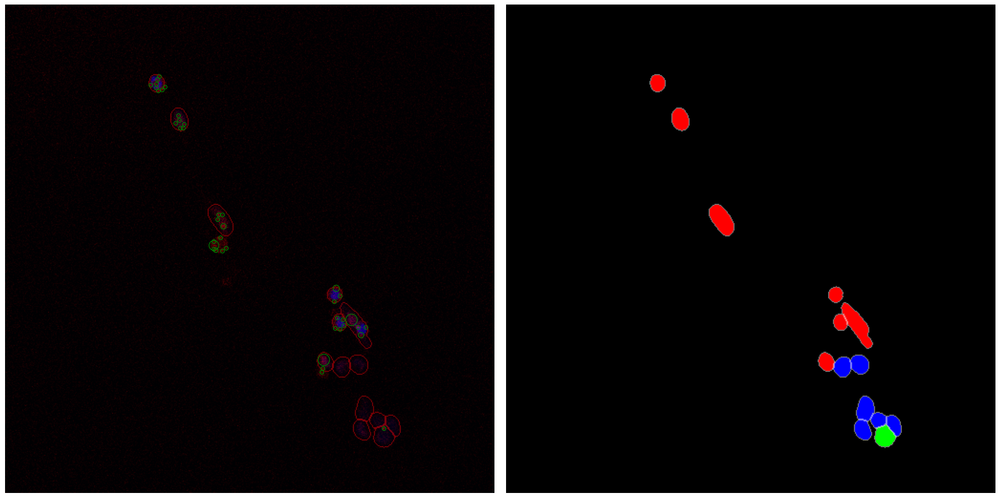

 10%|▉         | 2/21 [00:09<01:18,  4.13s/it]

(512, 512, 3) (512, 512, 3)


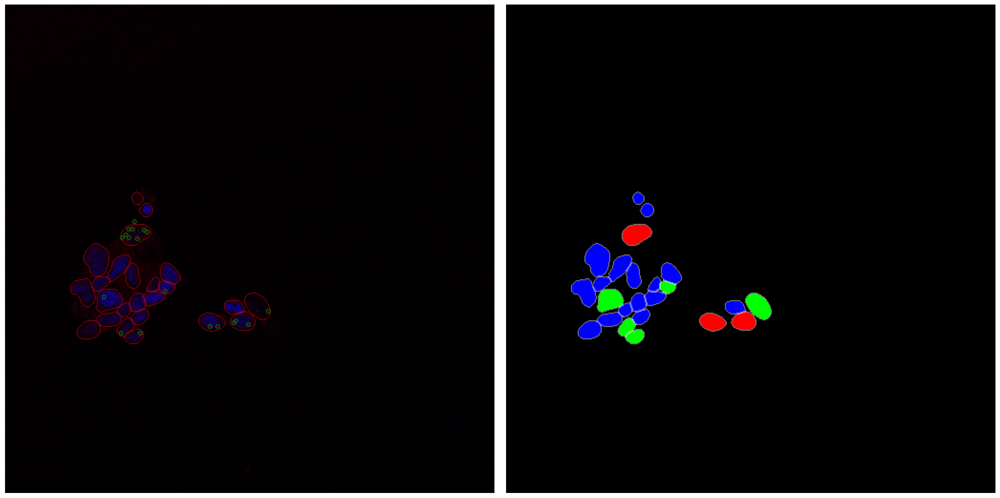

 14%|█▍        | 3/21 [00:11<00:57,  3.19s/it]

(512, 512, 3) (512, 512, 3)


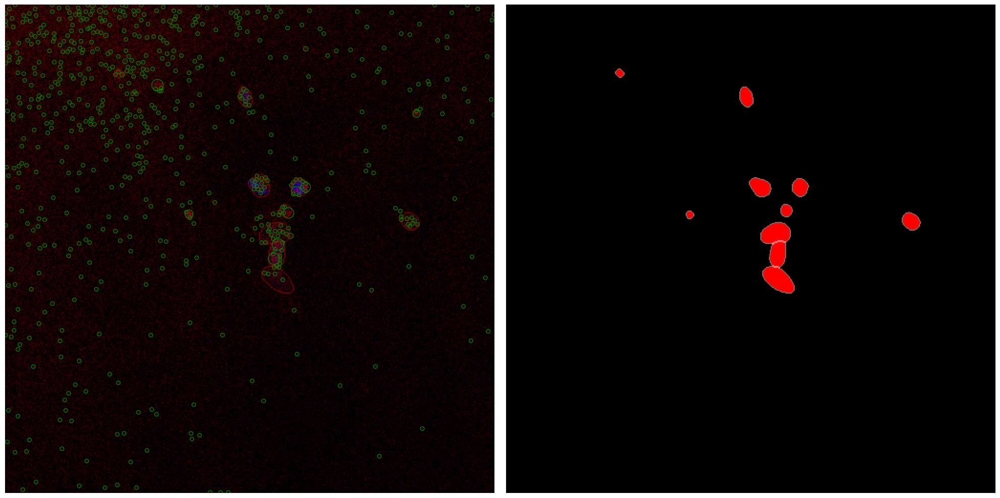

 19%|█▉        | 4/21 [00:16<01:06,  3.89s/it]

(512, 512, 3) (512, 512, 3)


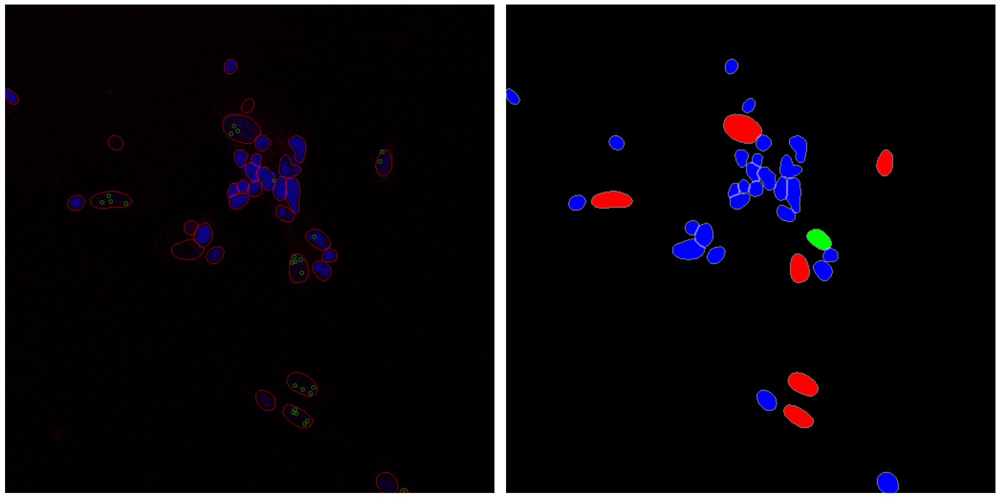

 24%|██▍       | 5/21 [00:18<00:51,  3.20s/it]

(512, 512, 3) (512, 512, 3)


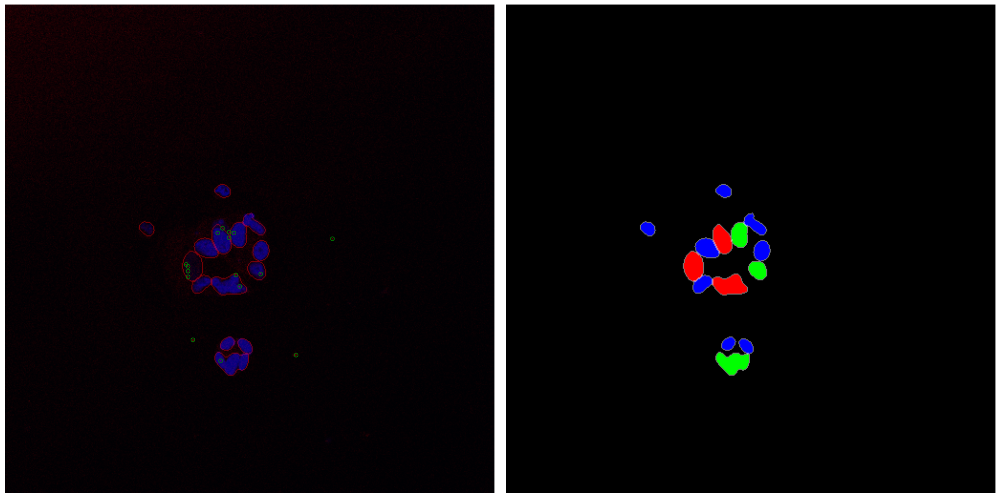

 29%|██▊       | 6/21 [00:19<00:41,  2.76s/it]

(512, 512, 3) (512, 512, 3)


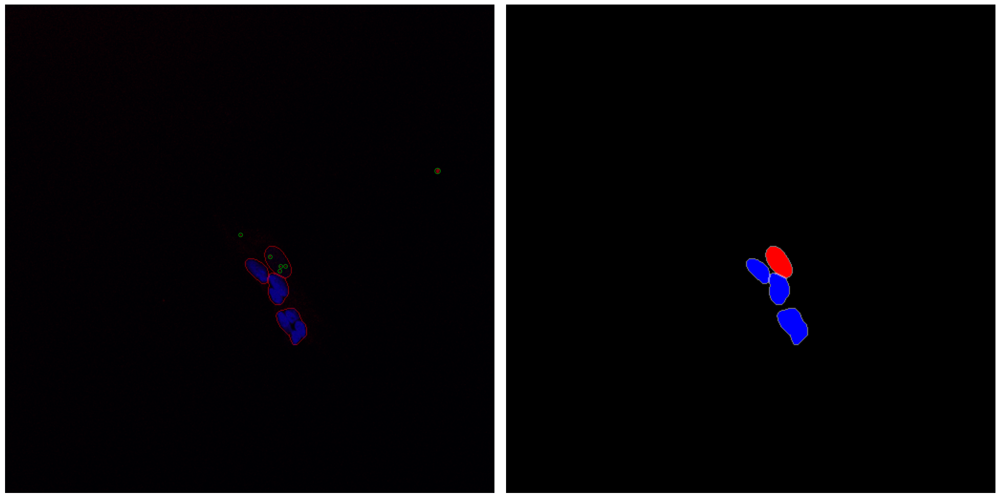

 33%|███▎      | 7/21 [00:21<00:34,  2.45s/it]

(512, 512, 3) (512, 512, 3)


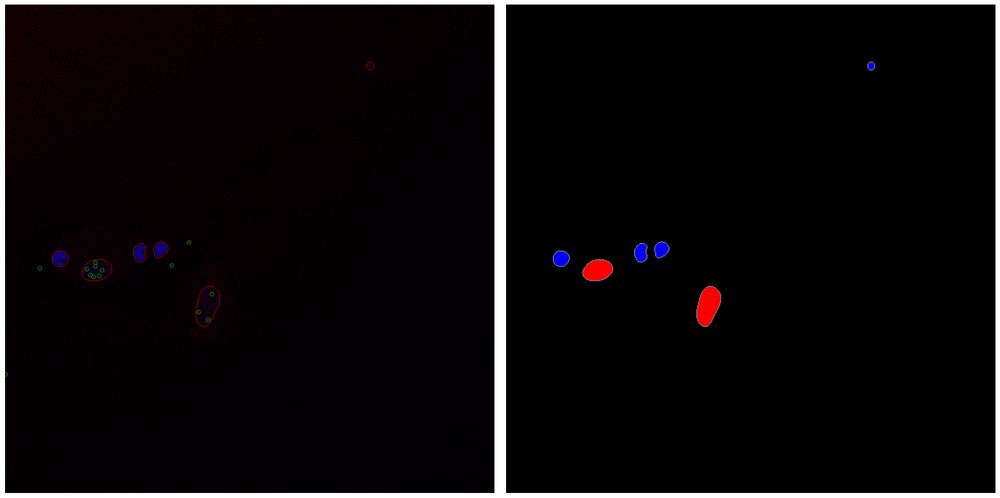

 38%|███▊      | 8/21 [00:23<00:30,  2.32s/it]

(512, 512, 3) (512, 512, 3)


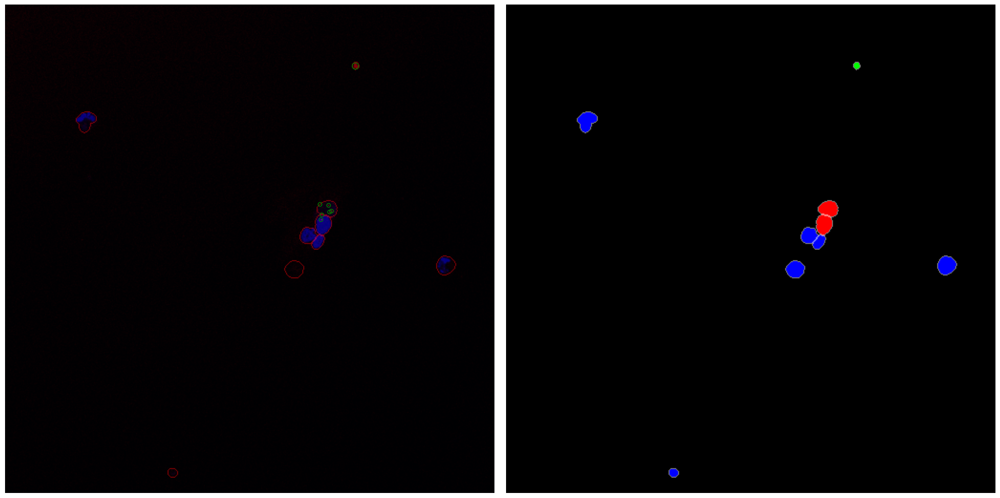

 43%|████▎     | 9/21 [00:25<00:26,  2.19s/it]

(512, 512, 3) (512, 512, 3)


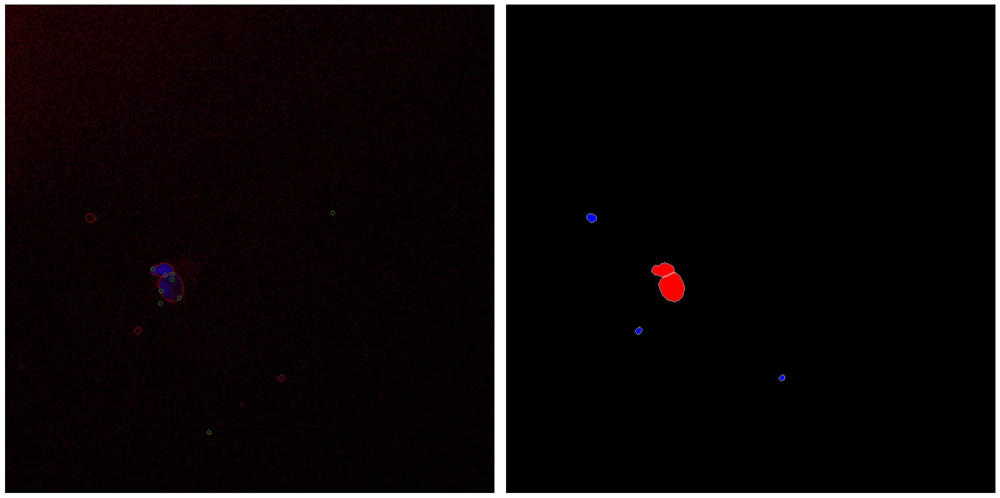

 48%|████▊     | 10/21 [00:27<00:23,  2.14s/it]

(512, 512, 3) (512, 512, 3)


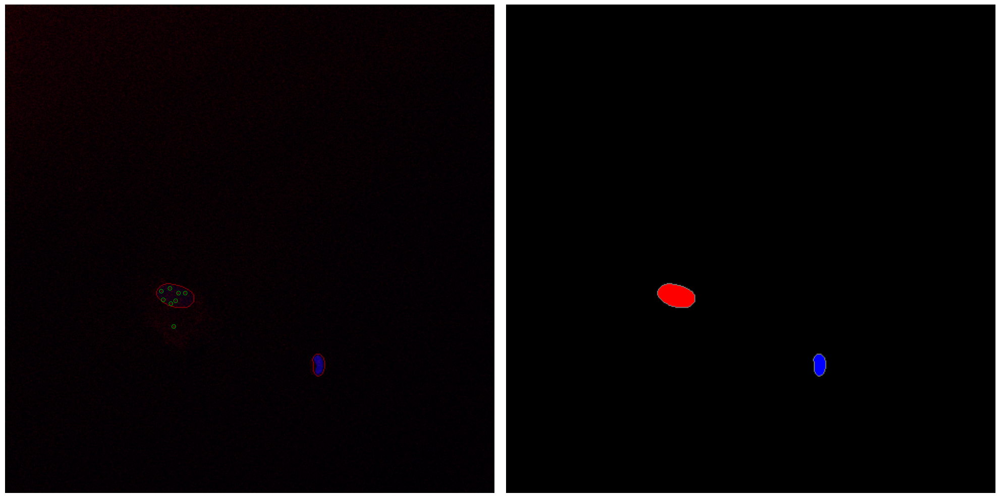

 52%|█████▏    | 11/21 [00:29<00:21,  2.12s/it]

(512, 512, 3) (512, 512, 3)


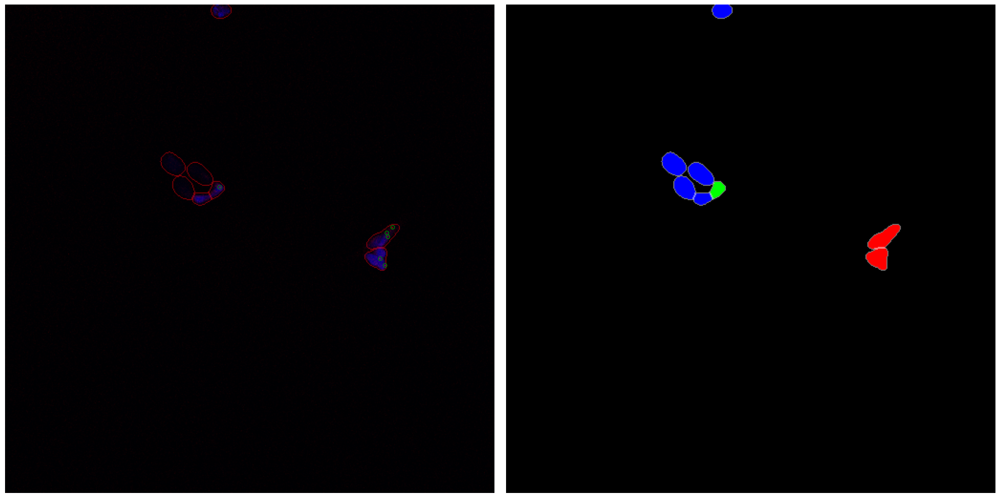

 57%|█████▋    | 12/21 [00:31<00:18,  2.10s/it]

(512, 512, 3) (512, 512, 3)


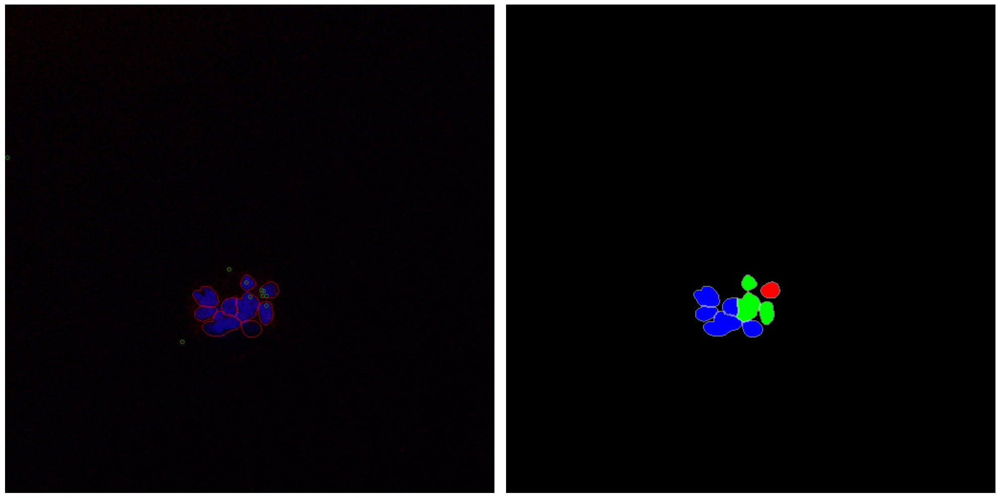

 62%|██████▏   | 13/21 [00:33<00:16,  2.07s/it]

(512, 512, 3) (512, 512, 3)


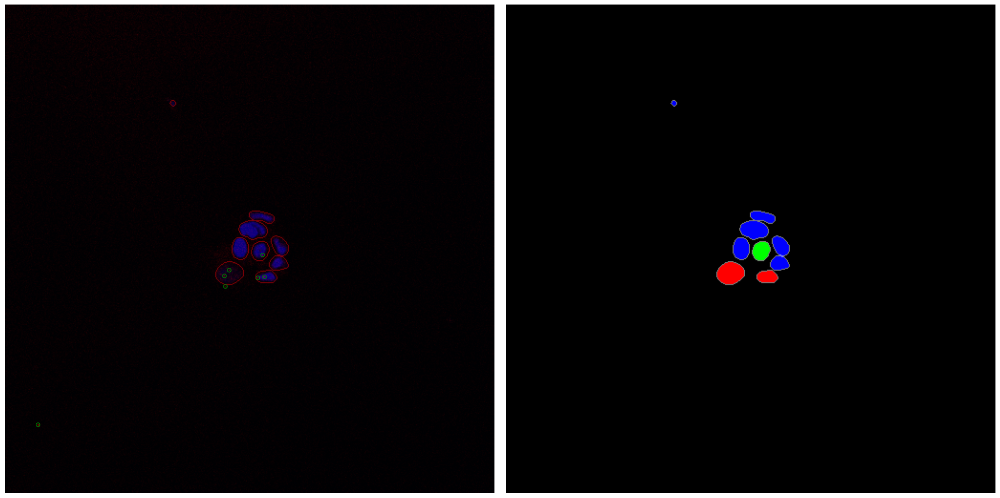

 67%|██████▋   | 14/21 [00:36<00:14,  2.10s/it]

(512, 512, 3) (512, 512, 3)


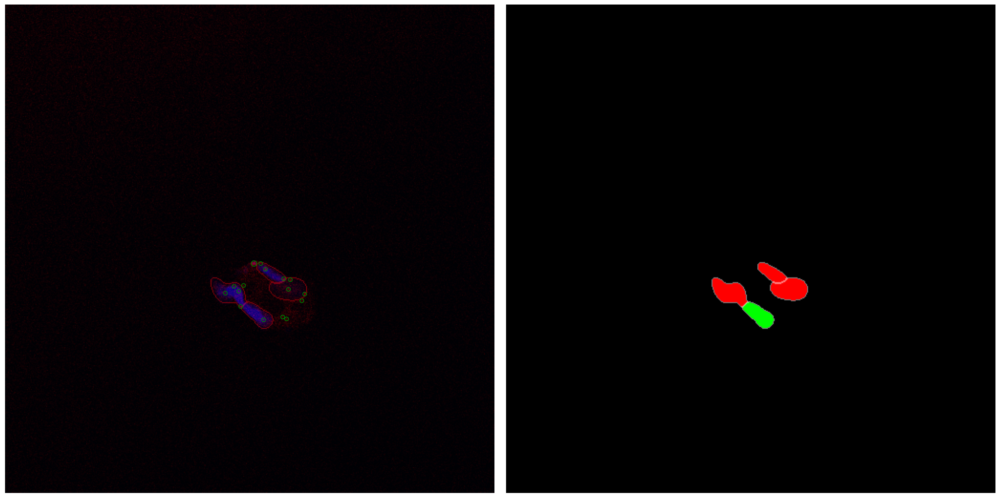

 71%|███████▏  | 15/21 [00:38<00:12,  2.12s/it]

(512, 512, 3) (512, 512, 3)


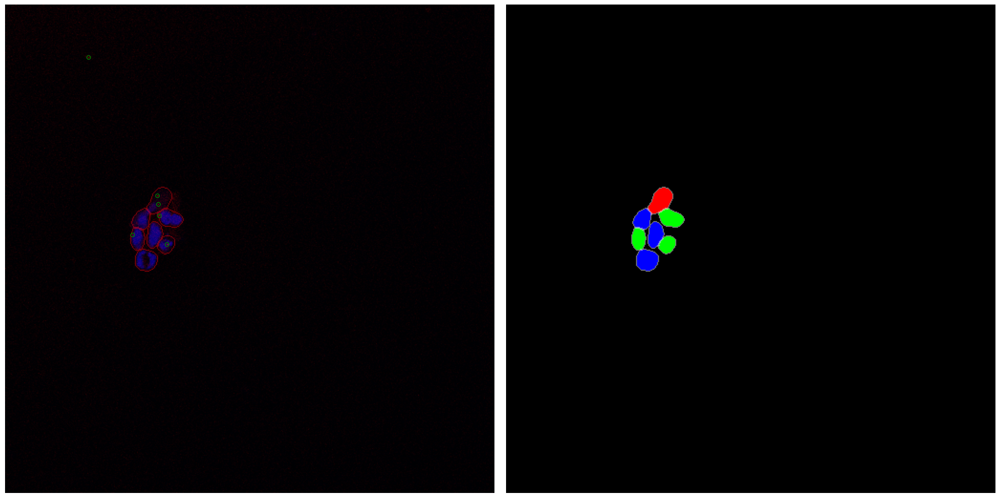

 76%|███████▌  | 16/21 [00:40<00:10,  2.08s/it]

(512, 512, 3) (512, 512, 3)


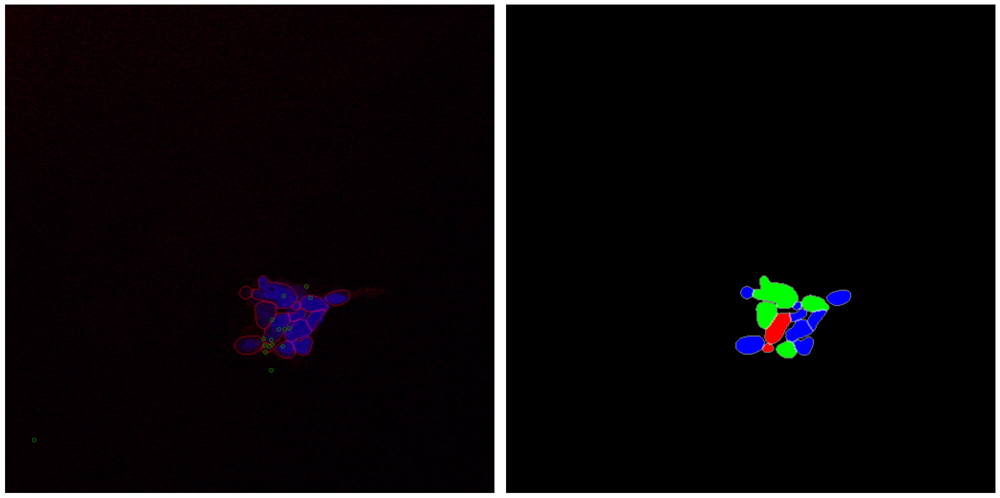

 81%|████████  | 17/21 [00:42<00:08,  2.09s/it]

(512, 512, 3) (512, 512, 3)


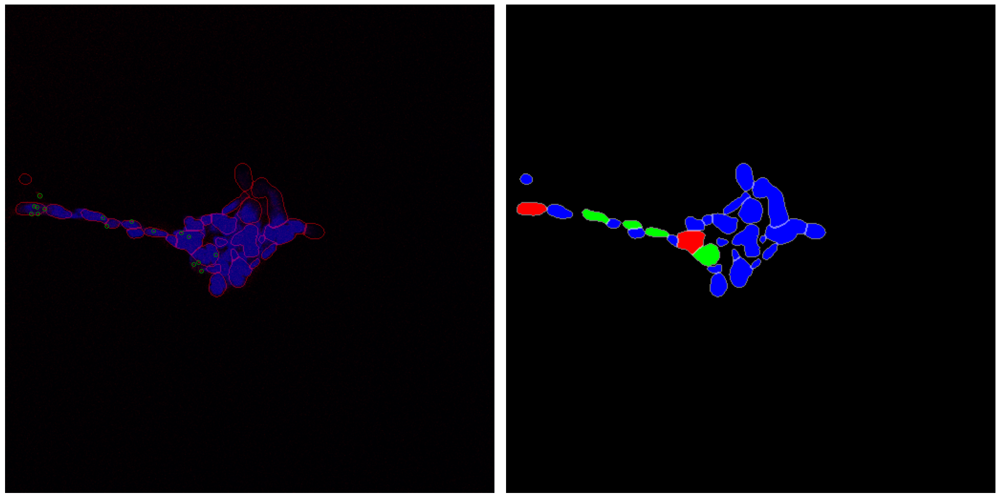

 86%|████████▌ | 18/21 [00:44<00:06,  2.06s/it]

(512, 512, 3) (512, 512, 3)


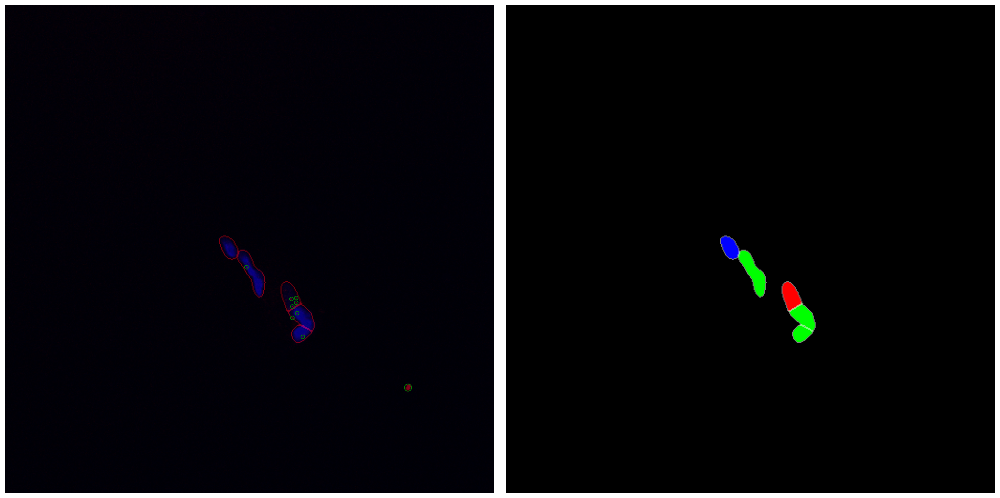

 90%|█████████ | 19/21 [00:46<00:04,  2.04s/it]

(512, 512, 3) (512, 512, 3)


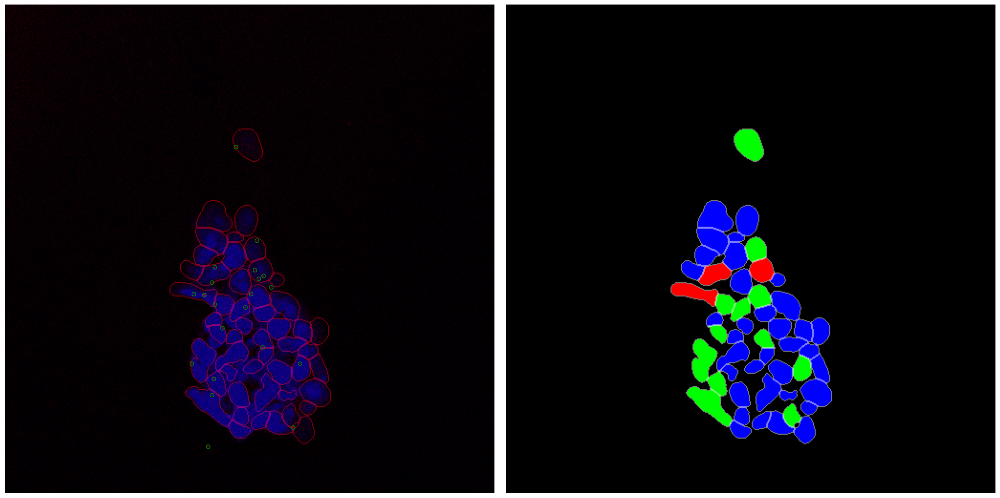

 95%|█████████▌| 20/21 [00:48<00:02,  2.08s/it]

(512, 512, 3) (512, 512, 3)


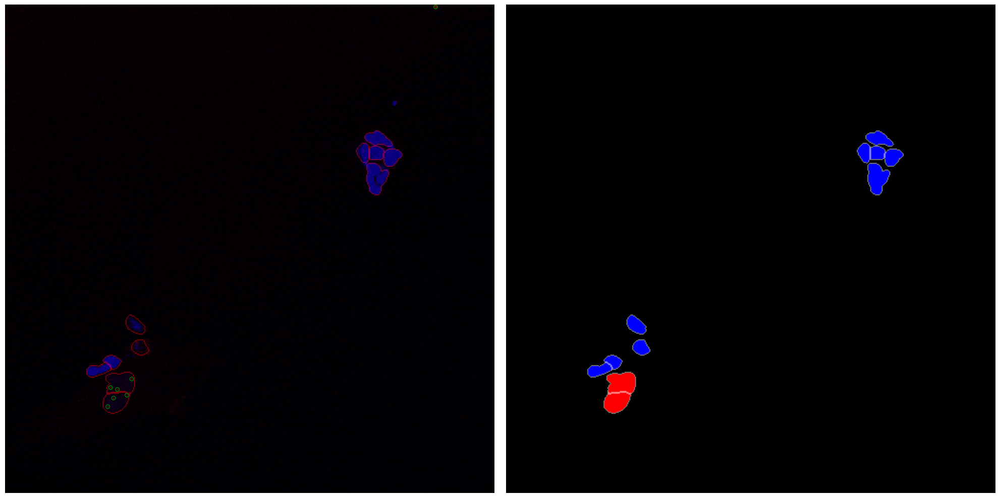

100%|██████████| 21/21 [00:50<00:00,  2.41s/it]


In [15]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from copy import deepcopy
from skimage.feature import blob_log
from skimage.segmentation import find_boundaries

# Function to overlay segmentation contours
def contoure_seg(masks, ret_rgb=True, rgb_color=[1,0,0]):
    boundaries = find_boundaries(masks, mode='outer')
    if ret_rgb:
        contour_image = np.zeros((*boundaries.shape, 3), dtype=np.float32)
        contour_image[boundaries] = rgb_color  # Red contours
    else:
        contour_image = boundaries.astype(np.float32)
    return contour_image

images_copy = deepcopy(images)
diameter = 35

for im_id, image in enumerate(tqdm(images_copy)):
    
    image = image[0]
    
    fig, ax = plt.subplots(1, 2, figsize=(20, 10))
    
    rgb_image = np.zeros((*image.shape[1:], 3))
    for i, im in enumerate([image[3], np.zeros_like(image[0]), image[0]]): 
        if not np.all(im == 0):
            #im = np.clip(im / np.percentile(im, 100), 0, 1)
            im = np.clip(im / np.percentile(im, 99.999), 0, 1)
        rgb_image[..., i] = im
        
    nuclei = apply_CLAHE(image[0], clip_limit=10, tile_grid_size=(16, 16))
    nuclei = nuclei / nuclei.max()

    masks, nuclei = ex.segment_image(
        nuclei,
        model="CP_TU", 
        cellpose_kwargs=dict(diameter=diameter, normalize=False, flow_threshold=1),
        dilate_masks=False)
        
    log_blobs = blob_log(rgb_image[..., 0], min_sigma=1, max_sigma=3, 
                         num_sigma=10, threshold=0.1)
    
    ax[0].imshow(np.clip(rgb_image + 0.5 * contoure_seg(masks, ret_rgb=True), 0, 0.5))
    for blob in log_blobs:
        y, x, r = blob
        circle = plt.Circle((x, y), r*2, color="green", linewidth=1, fill=False)
        ax[0].add_patch(circle)
    ax[0].axis('off')
    
    counts = []
    masks_count = np.zeros_like(rgb_image)
    for i in np.unique(masks):
        if i == 0:
            continue
        
        count = 0
        for blob in log_blobs:
            y, x, r = blob
            
            if masks[int(y), int(x)] == i:
                count += 1
                
        counts.append({'mask_id': i, 'count': count})
        if count == 0:
            masks_count[masks == i] = [0, 0, 1]
        elif count == 1:
            masks_count[masks == i] = [0, 1, 0]
        else:
            masks_count[masks == i] = [1, 0, 0]

    print(masks_count.shape, contoure_seg(masks, ret_rgb=True, rgb_color=[1,1,1]).shape)
   
    ax[1].imshow(np.clip(masks_count + 0.5 * contoure_seg(masks, ret_rgb=True, rgb_color=[1,1,1]), 0, 1))
    ax[1].axis('off')
    plt.tight_layout()
    plt.show()

    #break  # Process only the first image

In [ ]:
import pandas as pd
from pathlib import Path
import matplotlib.pyplot as plt
import json

filename = Path('/home/simon_g/isilon_images_mnt/10_MetaSystems/MetaSystemsData/_simon/src/sören_foci/annotations/CM_YAP_TEAD.csv')
experiment = filename.stem

annotations = pd.read_csv(filename)

image_folder = Path(f'/home/simon_g/isilon_images_mnt/10_MetaSystems/MetaSystemsData/_simon/src/sören_foci/images/{experiment}')
for _, row in annotations.iterrows():
    image = plt.imread(image_folder / row.img.split('-')[1])
    masks = plt.imread(image_folder / row.img.split('-')[1].replace('image', 'masks').replace('.png', '.tif'))
    #print(masks.shape)
    #plt.figure(figsize=(10,10))
    #plt.imshow(image)
    image_annotations = pd.DataFrame(json.loads(row['kp-1']))
    x = image_annotations['x']/100 * image_annotations['original_width']
    y = image_annotations['y']/100 * image_annotations['original_height']
    
    x_mask = x - image_annotations['original_width']//2
    
    labels = image_annotations['keypointlabels']

    label_mapping = {
        'OTHER': [0, 0, 1],
        'ADR': [0, 1, 0],
        'MES': [1, 0, 0]
    }
    
    

    rgb_masks = np.zeros([*masks.shape, 3])
    for x_coord, y_coord, label in zip(x_mask, y, labels):
        value = masks[int(y_coord), int(x_coord)]
        
        if value == 0:
            print('ERROR')
        else:
            rgb_masks[np.where(masks == value)] = label_mapping[label[0]]
    
    plt.imshow(rgb_masks)
    plt.show()
    #plt.scatter(x, y)
    #plt.show()